In [1]:
import os, random, shutil, json
from pathlib import Path
from collections import defaultdict
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import glob

In [2]:
DATA_DIR = "/kaggle/input/diordata"
OUT_DIR = "/kaggle/working/dior-fewshot"
os.makedirs(f"{OUT_DIR}/images/train", exist_ok=True)
os.makedirs(f"{OUT_DIR}/labels/train", exist_ok=True)
os.makedirs(f"{OUT_DIR}/images/val", exist_ok=True)
os.makedirs(f"{OUT_DIR}/labels/val", exist_ok=True)

In [3]:
# ---------------- Parameters ----------------
class_names = [
    "golffield",                # 0
    "Expressway-toll-station",  # 1
    "tenniscourt",              # 2
    "trainstation",             # 3
    "chimney",                  # 4
    "storagetank",              # 5
    "ship",                     # 6
    "harbor",                   # 7
    "airplane",                 # 8
    "groundtrackfield",         # 9
    "vehicle",                  # 10
    "dam",                      # 11
    "basketballcourt",          # 12
    "Expressway-Service-area",  # 13
    "stadium",                  # 14
    "airport",                  # 15
    "baseballfield",            # 16
    "bridge",                   # 17
    "windmill",                 # 18
    "overpass"                  # 19
]


In [4]:
# COCO category_id starts from 1
yolo2coco = {i: i+1 for i in range(len(class_names))}

novel_classes = [1, 2]  
k_shot = 5
n_per_class = 50  # base class images
random.seed(42)

In [5]:
# ---------------- Load image ids ----------------
with open(f"{DATA_DIR}/ImageSets/train.txt") as f:
    train_ids = f.read().splitlines()
with open(f"{DATA_DIR}/ImageSets/val.txt") as f:
    val_ids = f.read().splitlines()

# ---------------- Map class -> images ----------------
class_to_imgs = defaultdict(list)
for img_id in train_ids:
    label_file = Path(DATA_DIR)/"labels"/f"{img_id}.txt"
    if not label_file.exists():
        continue
    with open(label_file) as f:
        for line in f:
            c, *_ = map(float, line.strip().split())
            class_to_imgs[yolo2coco[int(c)]].append(img_id)

# ---------------- Select images ----------------
selected_novel_ids = set()
for c in novel_classes:
    imgs = list(set(class_to_imgs[c]))
    if len(imgs) <= k_shot:
        selected_novel_ids.update(imgs)
    else:
        selected_novel_ids.update(random.sample(imgs, k_shot))

selected_base_ids = set()
for c in range(1, len(class_names)+1):
    if c in novel_classes: continue
    imgs = list(set(class_to_imgs[c]) - selected_novel_ids)
    if len(imgs) <= n_per_class:
        selected_base_ids.update(imgs)
    else:
        selected_base_ids.update(random.sample(imgs, n_per_class))

# ---------------- Copy files ----------------
def copy_samples(ids, split):
    for img_id in ids:
        shutil.copy(f"{DATA_DIR}/images/{img_id}.jpg", f"{OUT_DIR}/images/{split}/{img_id}.jpg")
        shutil.copy(f"{DATA_DIR}/labels/{img_id}.txt", f"{OUT_DIR}/labels/{split}/{img_id}.txt")

copy_samples(selected_base_ids | selected_novel_ids, "train")
val_sample = random.sample(val_ids, 20)
copy_samples(val_sample, "val")

In [6]:
def yolo_to_coco(img_dir, label_dir, class_names, output_json):
    img_dir, label_dir = Path(img_dir), Path(label_dir)
    images, annotations = [], []
    ann_id = 1
    img_files = sorted(list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.png")))
    for img_id, img_file in enumerate(img_files):
        with Image.open(img_file) as im:
            w, h = im.size
        images.append({"id": img_id, "file_name": img_file.name, "width": w, "height": h})
        label_file = label_dir / (img_file.stem + ".txt")
        if not label_file.exists(): continue
        with open(label_file) as f:
            for line in f:
                c, x, y, bw, bh = map(float, line.strip().split())
                xmin = (x - bw/2) * w
                ymin = (y - bh/2) * h
                box_w, box_h = bw*w, bh*h
                annotations.append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": yolo2coco[int(c)],
                    "bbox": [xmin, ymin, box_w, box_h],
                    "area": box_w*box_h,
                    "iscrowd": 0
                })
                ann_id += 1
    categories = [{"id": i+1, "name": name} for i, name in enumerate(class_names)]
    coco_dict = {"images": images, "annotations": annotations, "categories": categories}
    with open(output_json, "w") as f:
        json.dump(coco_dict, f, indent=2)
    print(f"Saved {output_json} with {len(images)} images and {len(annotations)} annotations.")

yolo_to_coco(f"{OUT_DIR}/images/train", f"{OUT_DIR}/labels/train", class_names, f"{OUT_DIR}/train.json")
yolo_to_coco(f"{OUT_DIR}/images/val", f"{OUT_DIR}/labels/val", class_names, f"{OUT_DIR}/val.json")

Saved /kaggle/working/dior-fewshot/train.json with 899 images and 9067 annotations.
Saved /kaggle/working/dior-fewshot/val.json with 20 images and 223 annotations.


In [7]:
# ---------------- Dataset ----------------
class AerialFewShotDataset(Dataset):
    def __init__(self, images_dir, annotations, transforms=None):
        self.images_dir = Path(images_dir)
        self.ann = annotations
        self.imgs = {img['id']: img for img in self.ann['images']}
        self.anns_by_img = {}
        for a in self.ann['annotations']:
            self.anns_by_img.setdefault(a['image_id'], []).append(a)
        self.ids = list(self.imgs.keys())
        self.transforms = transforms

    def __len__(self): return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_info = self.imgs[img_id]
        img_path = self.images_dir / img_info['file_name']
        img = Image.open(img_path).convert("RGB")

        anns = self.anns_by_img.get(img_id, [])
        boxes, labels = [], []
        for a in anns:
            x, y, w, h = a['bbox']
            boxes.append([x, y, x+w, y+h])
            labels.append(a['category_id'])

        boxes = torch.as_tensor(boxes, dtype=torch.float32) if boxes else torch.zeros((0,4), dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64) if labels else torch.zeros((0,), dtype=torch.int64)
        target = {'boxes': boxes, 'labels': labels, 'image_id': torch.tensor([img_id])}
        img = F.to_tensor(img) if self.transforms is None else self.transforms(img)
        return img, target

# ---------------- Model ----------------
def get_model(num_classes):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

# ---------------- Load COCO annotations ----------------
with open(f"{OUT_DIR}/train.json") as f:
    orig_ann = json.load(f)

# ---------------- Split base & novel ----------------
novel_img_dict = {c: [] for c in novel_classes}
for a in orig_ann['annotations']:
    if a['category_id'] in novel_classes:
        novel_img_dict[a['category_id']].append(a['image_id'])

novel_selected = set()
for c, lst in novel_img_dict.items():
    random.shuffle(lst)
    novel_selected.update(lst[:k_shot])

base_selected = [img['id'] for img in orig_ann['images'] if img['id'] not in novel_selected]

base_ann = {
    'images': [img for img in orig_ann['images'] if img['id'] in base_selected],
    'annotations': [a for a in orig_ann['annotations'] if a['image_id'] in base_selected],
    'categories': orig_ann['categories']
}

novel_ann = {
    'images': [img for img in orig_ann['images'] if img['id'] in novel_selected],
    'annotations': [a for a in orig_ann['annotations'] if a['image_id'] in novel_selected and a['category_id'] in novel_classes],
    'categories': orig_ann['categories']
}

IMAGES_DIR = f"{OUT_DIR}/images/train"
train_ds_base = AerialFewShotDataset(IMAGES_DIR, base_ann)
data_loader_base = DataLoader(train_ds_base, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

train_ds_novel = AerialFewShotDataset(IMAGES_DIR, novel_ann)
data_loader_novel = DataLoader(train_ds_novel, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

# ---------------- Train ----------------
num_classes = len(class_names) + 1  # +1 vì category_id bắt đầu từ 1
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model = get_model(num_classes).to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0025, momentum=0.9, weight_decay=0.0005)




/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:00<00:00, 197MB/s]


In [8]:
# Step 1: Train base classes
num_epochs_base = 5 
for epoch in range(num_epochs_base):
    model.train()
    for images, targets in data_loader_base:
        images = [img.to(device) for img in images]
        t_targets = [{k:v.to(device) for k,v in tgt.items()} for tgt in targets]
        loss_dict = model(images, t_targets)
        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    print(f"Base epoch {epoch} done")

Base epoch 0 done
Base epoch 1 done
Base epoch 2 done
Base epoch 3 done
Base epoch 4 done


In [9]:
# Step 2: Fine-tune novel classes (few-shot)
num_epochs_novel = 5
for epoch in range(num_epochs_novel):
    model.train()
    for images, targets in data_loader_novel:
        images = [img.to(device) for img in images]
        t_targets = [{k:v.to(device) for k,v in tgt.items()} for tgt in targets]
        loss_dict = model(images, t_targets)
        losses = sum(loss for loss in loss_dict.values())
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    print(f"Novel epoch {epoch} done")

Novel epoch 0 done
Novel epoch 1 done
Novel epoch 2 done
Novel epoch 3 done
Novel epoch 4 done


Predictions for /kaggle/working/dior-fewshot/images/val/00102.jpg:


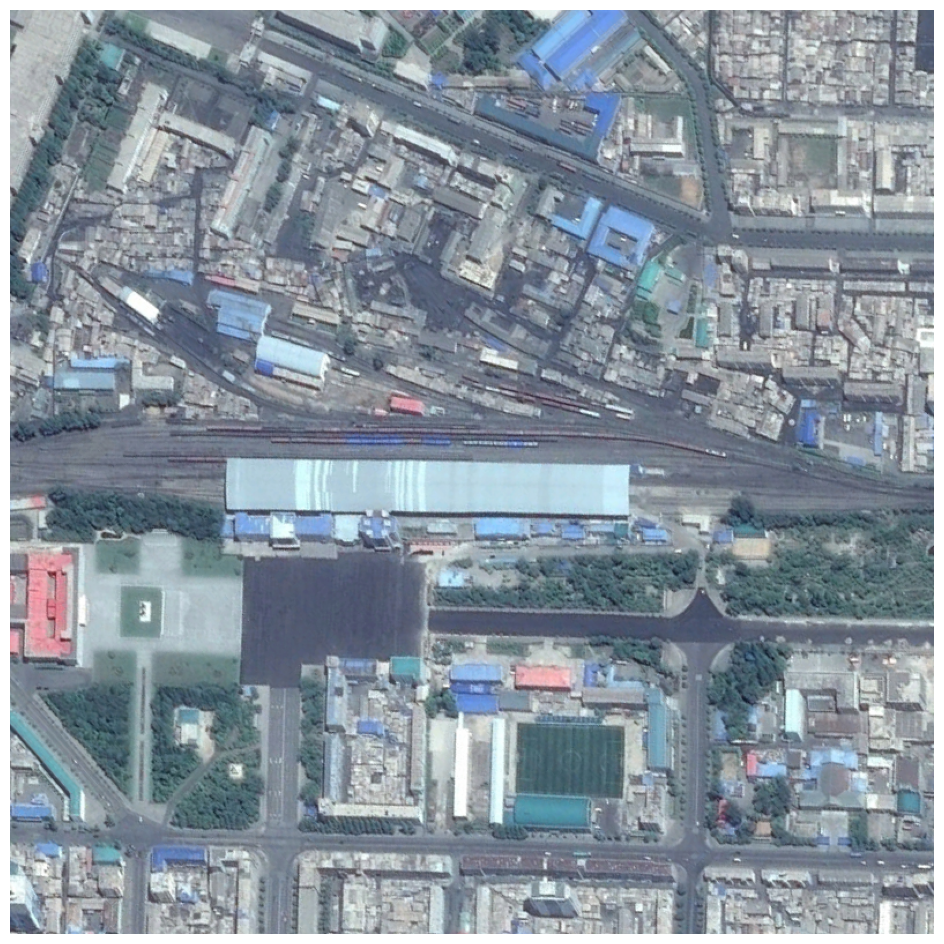

Predictions for /kaggle/working/dior-fewshot/images/val/01331.jpg:


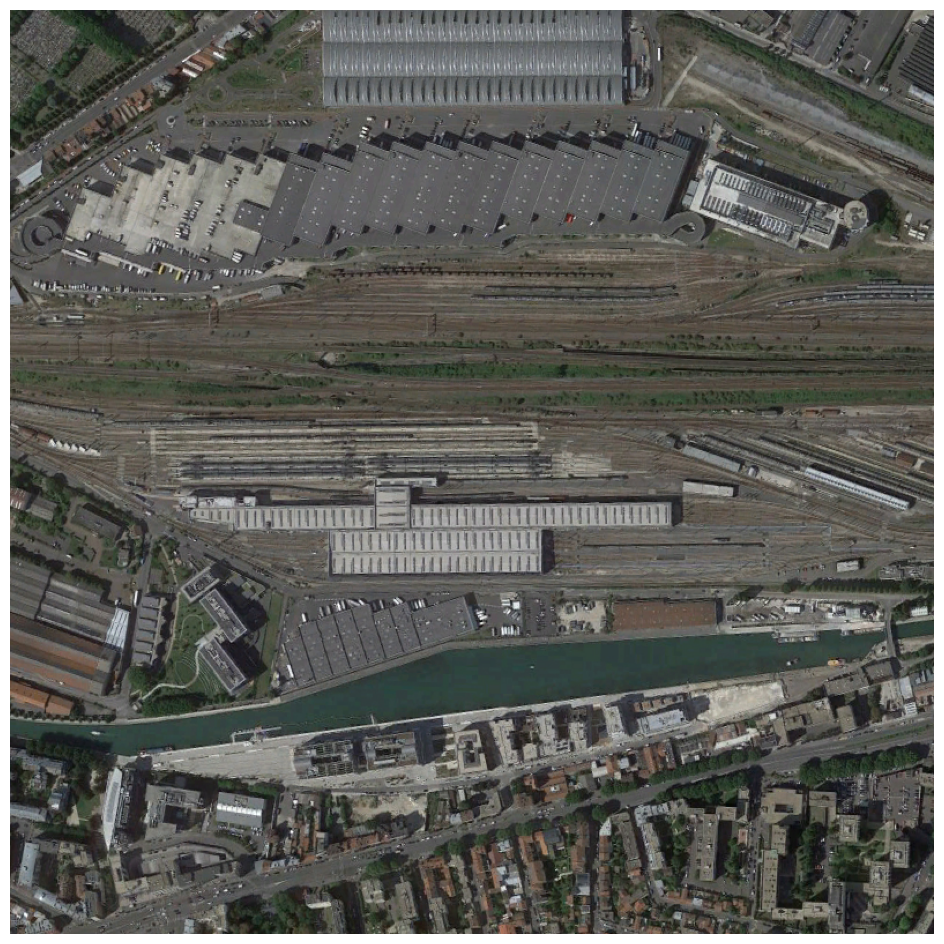

Predictions for /kaggle/working/dior-fewshot/images/val/02536.jpg:
  airplane: 0.68


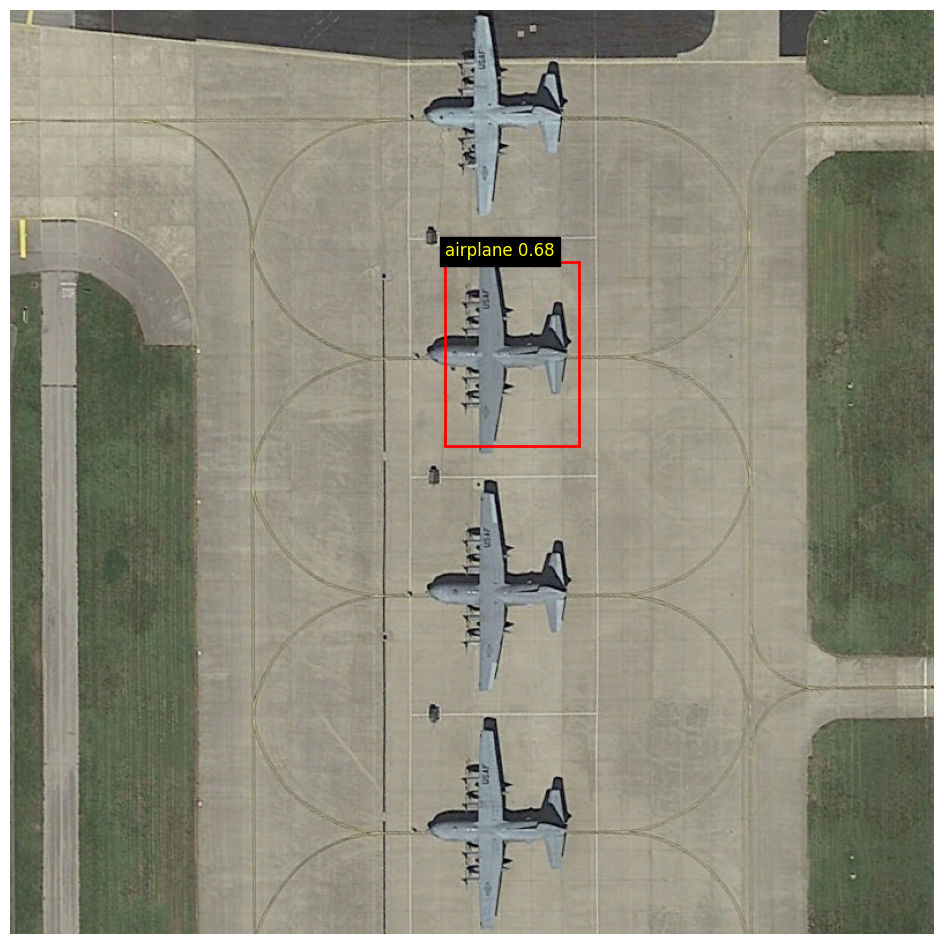

Predictions for /kaggle/working/dior-fewshot/images/val/03204.jpg:
  tenniscourt: 0.71
  tenniscourt: 0.58
  tenniscourt: 0.57


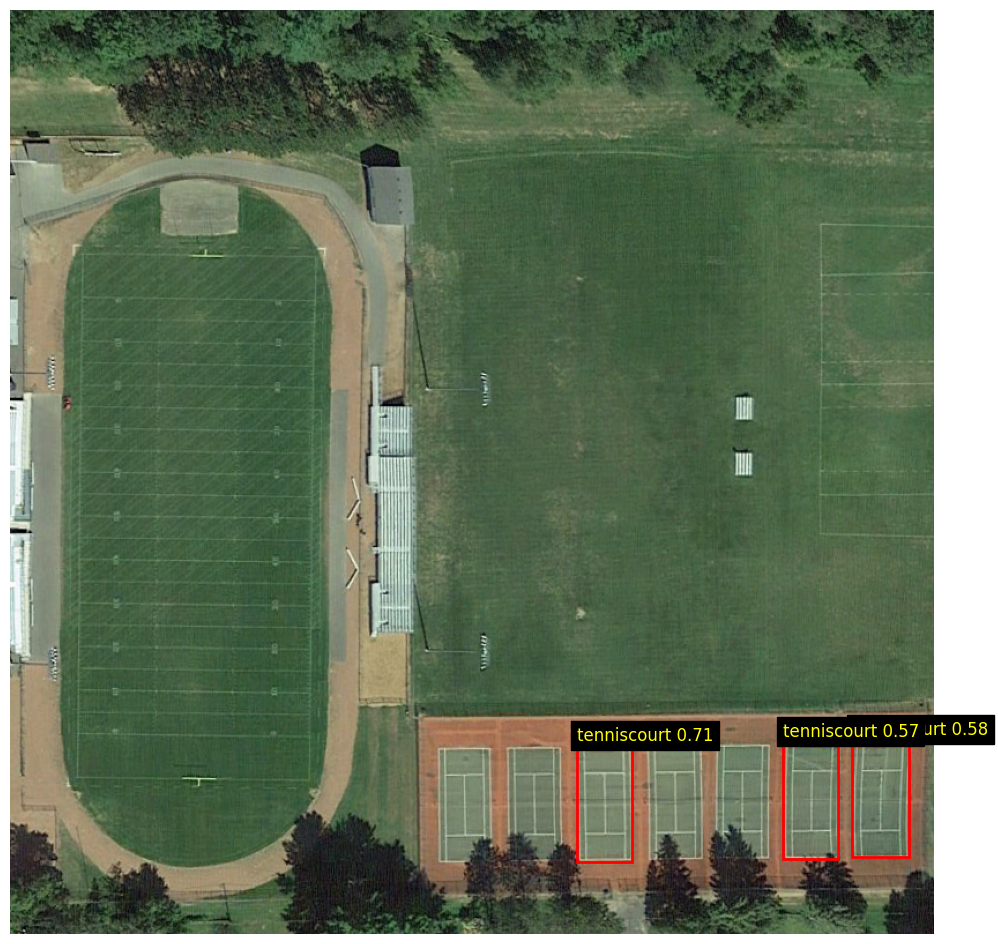

Predictions for /kaggle/working/dior-fewshot/images/val/03501.jpg:
  airplane: 0.96
  airplane: 0.95


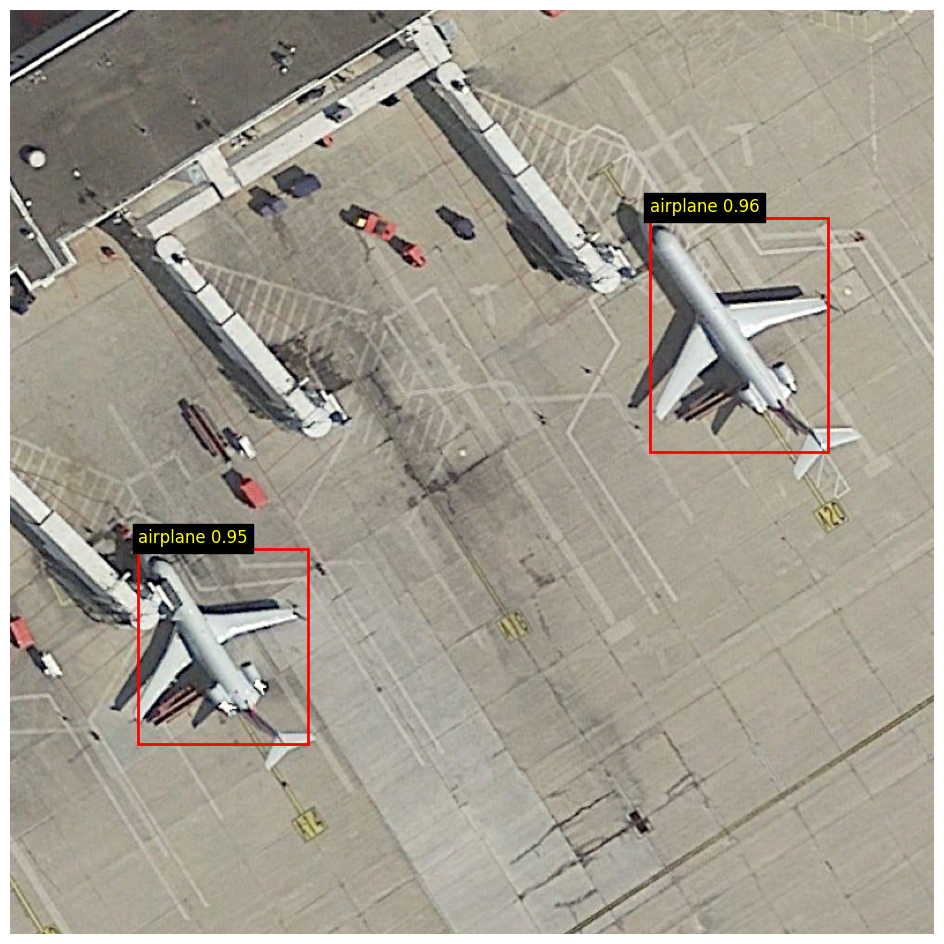

Predictions for /kaggle/working/dior-fewshot/images/val/04293.jpg:
  chimney: 0.70


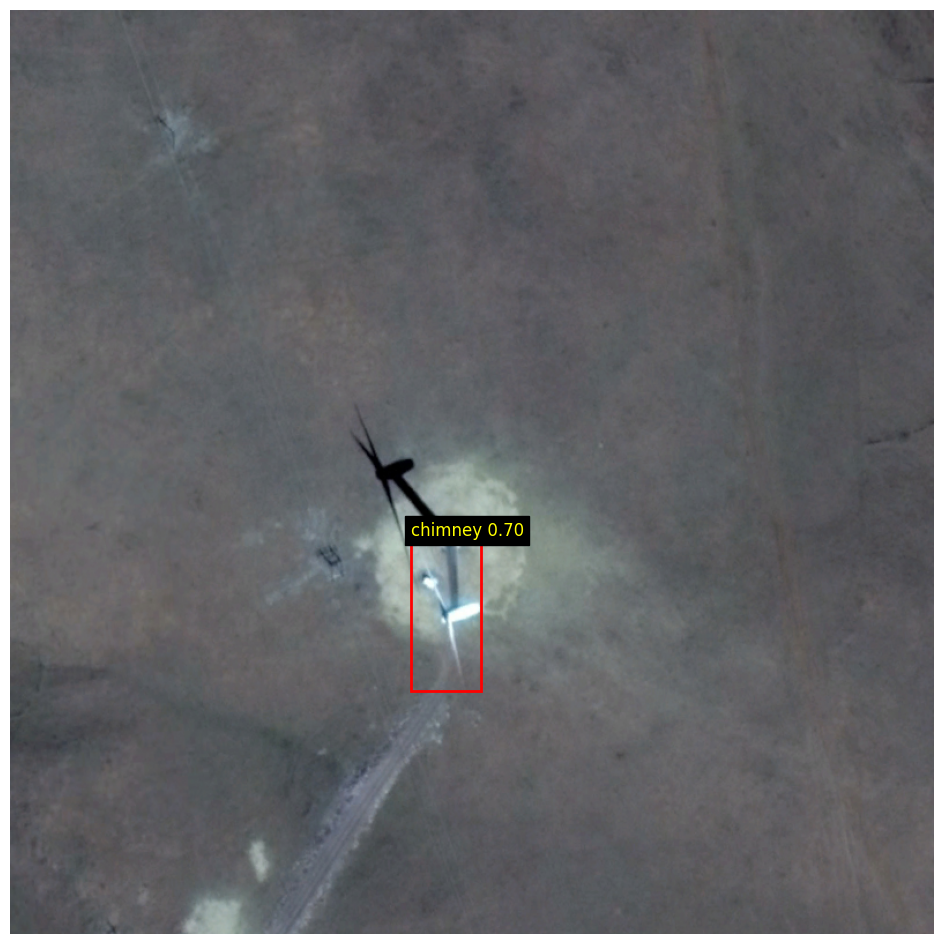

Predictions for /kaggle/working/dior-fewshot/images/val/07131.jpg:
  storagetank: 0.66


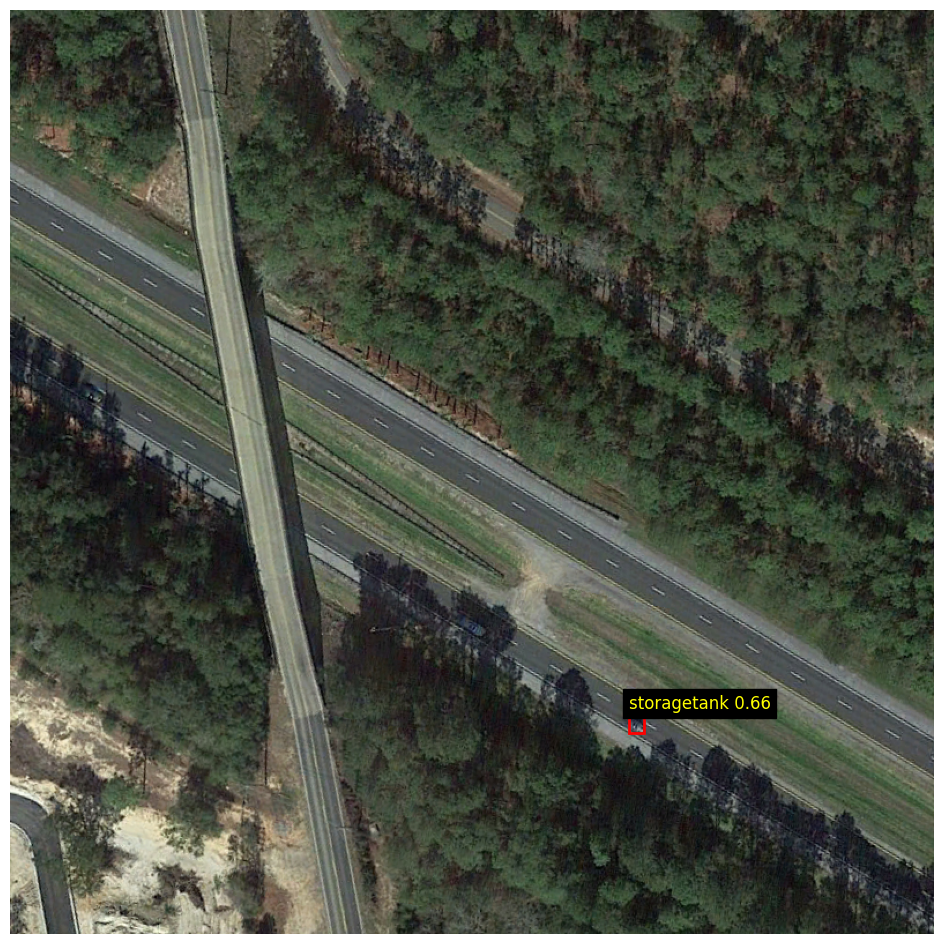

Predictions for /kaggle/working/dior-fewshot/images/val/07154.jpg:
  storagetank: 0.91
  trainstation: 0.89
  storagetank: 0.83
  storagetank: 0.79
  storagetank: 0.71


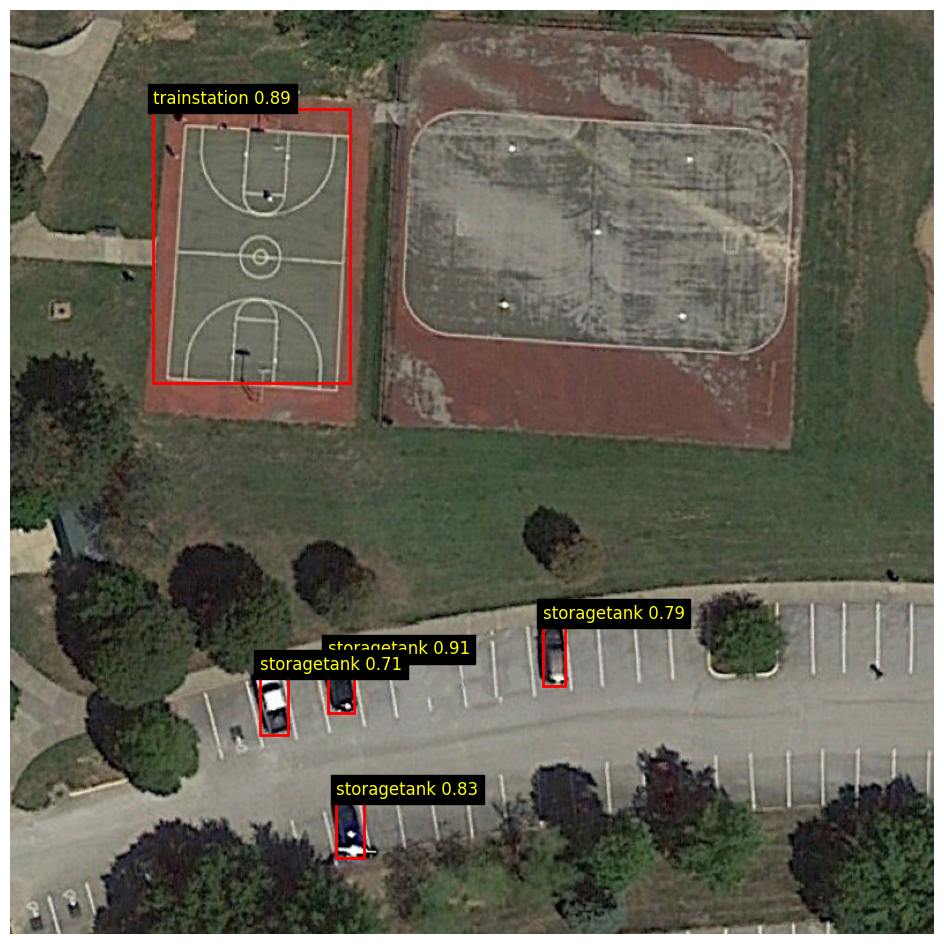

Predictions for /kaggle/working/dior-fewshot/images/val/07835.jpg:
  Expressway-Service-area: 0.59


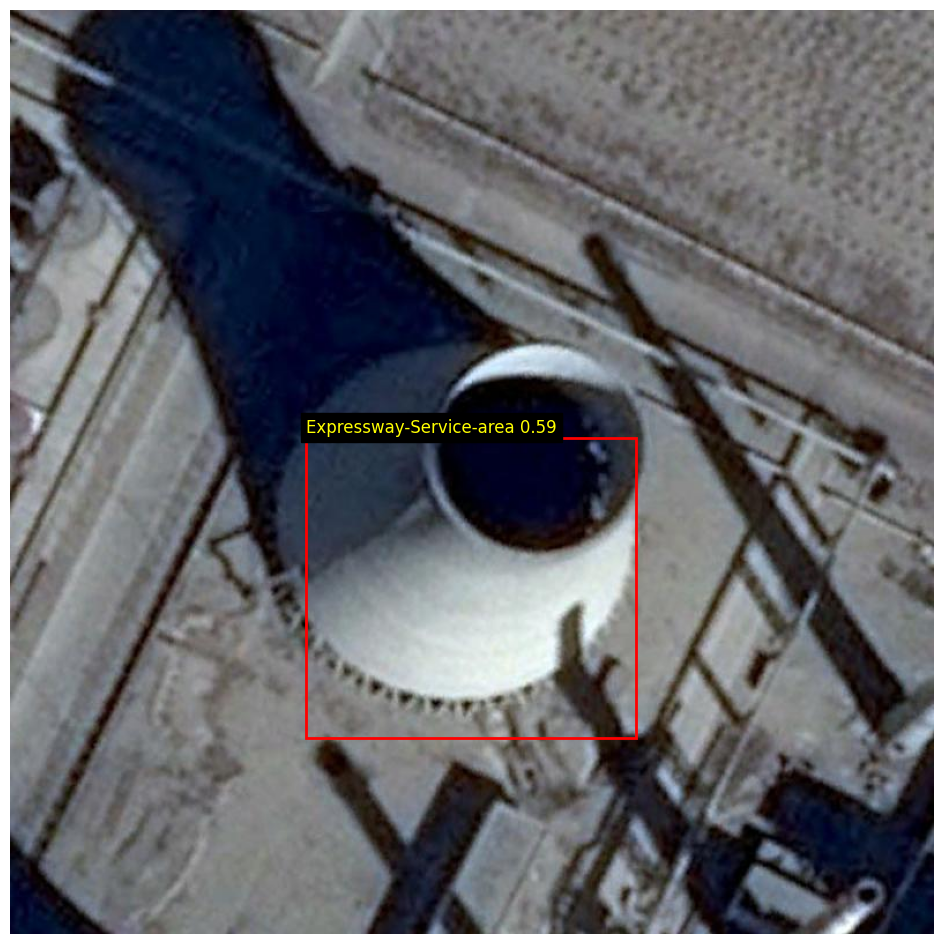

Predictions for /kaggle/working/dior-fewshot/images/val/09421.jpg:
  tenniscourt: 0.91
  tenniscourt: 0.90
  tenniscourt: 0.90
  tenniscourt: 0.89
  tenniscourt: 0.88
  tenniscourt: 0.78


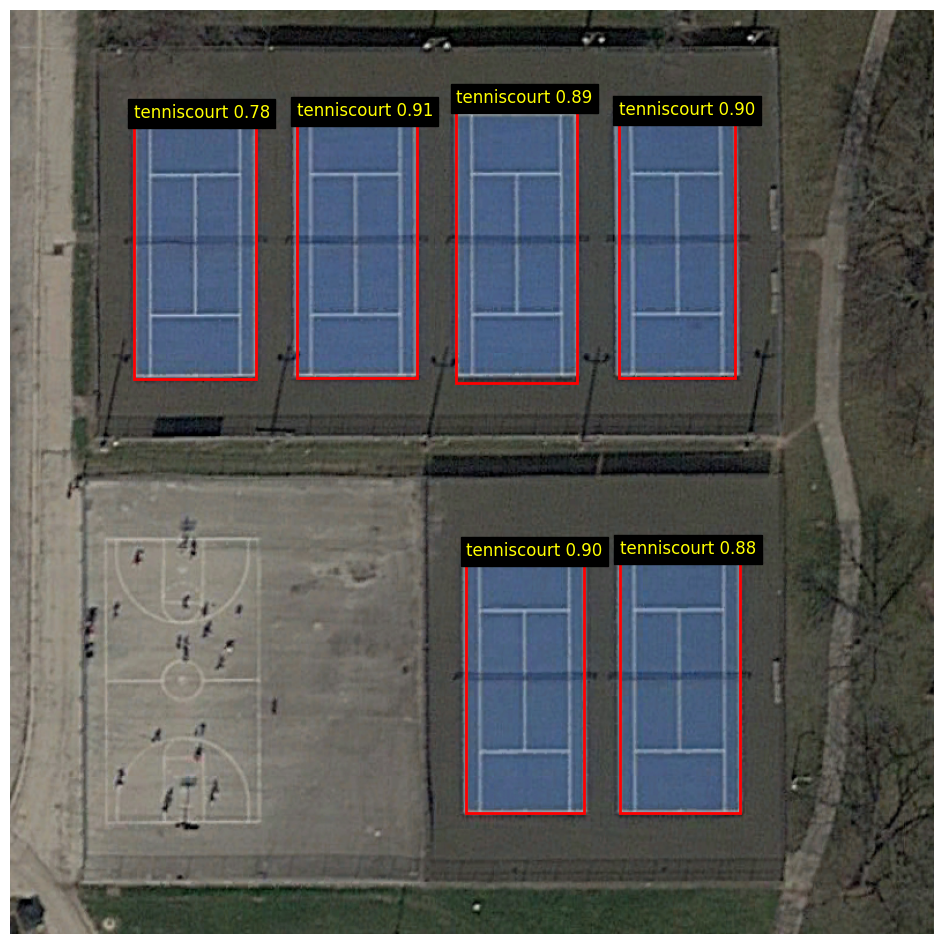

In [10]:

# ---------------- Inference & Visualize ----------------
score_thresh = 0.4
test_images_dir = f"{OUT_DIR}/images/val"

def predict_image(model, img_path, score_thresh=0.5):
    model.eval()
    img = Image.open(img_path).convert("RGB")
    img_tensor = F.to_tensor(img).unsqueeze(0).to(device)
    with torch.no_grad():
        outputs = model(img_tensor)
    preds = outputs[0]
    keep = preds['scores'] > score_thresh
    boxes = preds['boxes'][keep].cpu().numpy()
    labels = preds['labels'][keep].cpu().numpy()
    scores = preds['scores'][keep].cpu().numpy()
    results = []
    for b, l, s in zip(boxes, labels, scores):
        label_name = next(c['name'] for c in orig_ann['categories'] if c['id'] == int(l))
        results.append({"bbox": b.tolist(), "label": label_name, "score": float(s)})
    return img, results

def visualize_predictions(img, preds):
    fig, ax = plt.subplots(1, figsize=(12,12))
    ax.imshow(img)
    for p in preds:
        x1, y1, x2, y2 = p['bbox']
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1-5, f"{p['label']} {p['score']:.2f}", color='yellow', fontsize=12, backgroundcolor='black')
    plt.axis('off')
    plt.show()

test_imgs = sorted(glob.glob(f"{test_images_dir}/*.jpg"))
for img_path in test_imgs[:10]:
    img, preds = predict_image(model, img_path, score_thresh)
    print(f"Predictions for {img_path}:")
    for p in preds:
        print(f"  {p['label']}: {p['score']:.2f}")
    visualize_predictions(img, preds)